In [114]:
import numpy as np
import librosa
from sklearn.manifold import LocallyLinearEmbedding
import os

In [2]:
def load_and_divide_audio(audio_path, frame_length=2048, hop_length=512):
    audio, sr = librosa.load(audio_path)
    audio_frames = librosa.util.frame(audio, frame_length=frame_length, hop_length=hop_length)
    return audio_frames, sr

In [3]:
def calculate_spectrogram(audio_frame, n_fft=2048, hop_length=512):
    spectrogram = np.abs(librosa.stft(audio_frame, n_fft=n_fft, hop_length=hop_length))
    return spectrogram

In [4]:
def get_peak_frequencies(spectrogram, n_peaks=5):
    peak_frequencies = []
    for frame in spectrogram.T:
        peaks, _ = librosa.find_peaks(frame, height=0, distance=1)
        peak_values = frame[peaks]
        top_n_peaks = peak_values.argsort()[-n_peaks:][::-1]
        top_n_frequencies = [librosa.fft_frequencies()[p] for p in peaks[top_n_peaks]]
        peak_frequencies.append(top_n_frequencies)
    return np.array(peak_frequencies)

In [5]:
def calculate_peak_amplitudes(spectrogram, peak_frequencies):
    peak_amplitudes = []
    for i, frame in enumerate(spectrogram.T):
        amplitudes = []
        for frequency in peak_frequencies[i]:
            frequency_index = np.argmin(np.abs(librosa.fft_frequencies() - frequency))
            amplitudes.append(frame[frequency_index])
        peak_amplitudes.append(amplitudes)
    return np.array(peak_amplitudes)

In [6]:
def build_peak_matrix(peak_frequencies, peak_amplitudes):
    peak_matrix = []
    for i in range(len(peak_frequencies)):
        frame_peaks = []
        for j in range(len(peak_frequencies[i])):
            frame_peaks.append([peak_frequencies[i][j], peak_amplitudes[i][j]])
        peak_matrix.append(frame_peaks)
    return np.array(peak_matrix)

In [9]:
def apply_lle(peak_matrix, n_components=10):
    peak_matrix_reshaped = peak_matrix.reshape(peak_matrix.shape[0], -1)
    lle = LocallyLinearEmbedding(n_components=n_components, n_neighbors=5)
    lle_features = lle.fit_transform(peak_matrix_reshaped)
    return lle_features


In [10]:
def apply_lle(peak_matrix, n_components=10):
    peak_matrix_reshaped = peak_matrix.reshape(peak_matrix.shape[0], -1)
    lle = LocallyLinearEmbedding(n_components=n_components, n_neighbors=5)
    lle_features = lle.fit_transform(peak_matrix_reshaped)
    return lle_features


In [115]:
import os
import librosa
import IPython.display as ipd
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage  import generate_binary_structure , binary_erosion , iterate_structure
from scipy.ndimage import maximum_filter




In [116]:
os.chdir('/home/akshat/signals/')

In [37]:
os.getcwd()

'/home/akshat/signals/dataset/genres/jazz'

In [118]:
song = "love story.mp3"


In [54]:
song = "01 Come Together.mp3"

In [119]:
ipd.Audio(song)

In [120]:
scale , sr = librosa.load(song,sr=8000)

Note: Illegal Audio-MPEG-Header 0x0a446570 at offset 9465868.
Note: Trying to resync...
Note: Skipped 1024 bytes in input.
[src/libmpg123/parse.c:wetwork():1365] error: Giving up resync after 1024 bytes - your stream is not nice... (maybe increasing resync limit could help).
/tmp/ipykernel_8850/1118327446.py:1: UserWarning: PySoundFile failed. Trying audioread instead.
  scale , sr = librosa.load(song,sr=8000)
/home/akshat/anaconda3/lib/python3.10/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


In [121]:
sr 

8000

In [122]:
scale.shape

(1893147,)

In [123]:
hop_length = int(sr * 0.09)  # 10 ms hop
win_length = int(sr * 0.1)   # 100 ms frame
spectogram = librosa.stft(scale, n_fft=win_length, hop_length=hop_length)
spectogram = np.abs(spectogram)


In [125]:
spectogram.shape

(401, 2630)

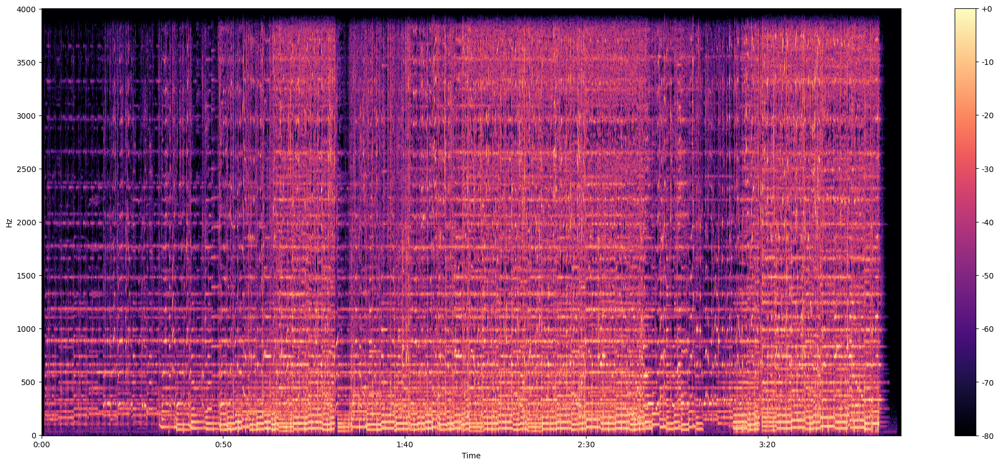

In [126]:
def plot_spectrogram(Y, sr, hop_length, y_axis="linear"):
    plt.figure(figsize=(25, 10))
    librosa.display.specshow(Y, 
                             sr=sr, 
                             hop_length=hop_length, 
                             x_axis="time", 
                             y_axis=y_axis)
    plt.colorbar(format="%+2.f")
plot_spectrogram(librosa.amplitude_to_db(spectogram, ref=np.max), sr, hop_length)

In [127]:
mel_spectrogram = librosa.feature.melspectrogram(S=spectogram, sr=sr, n_mels=18,n_fft=win_length, hop_length=hop_length)

In [128]:
mel_spectrogram.shape

(18, 2630)

In [129]:
#convert to float
mel_spectrogram = np.abs(mel_spectrogram)

In [130]:
PEAK_NEIGHBORHOOD_SIZE = 20
DEFAULT_AMP_MIN = 0


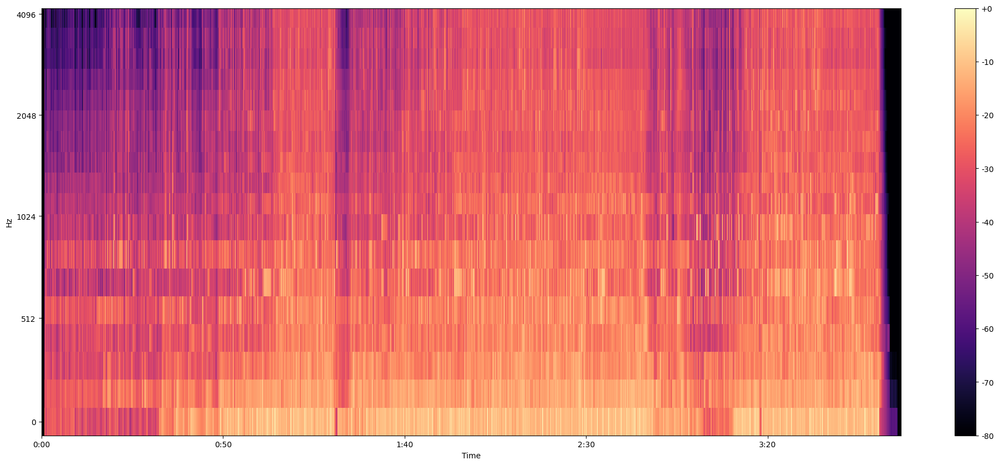

In [131]:
plot_spectrogram(librosa.amplitude_to_db(mel_spectrogram, ref=np.max), sr, hop_length, y_axis="mel")

In [132]:
mel_spectrogram.shape

(18, 2630)

In [144]:
from scipy.signal import find_peaks
j = 0
DEFAULT_AMP_MIN = 0.1
twod_peaks = []
for frame in mel_spectrogram.T:
    peaks, _ = find_peaks(frame)
    #Get the bigggest peak
    maxPeak = -float('inf')    
    maxPeakIndex = -1
    for peak in peaks :
        if peak >= 2 and frame[peak] > maxPeak :
            maxPeak = frame[peak]
            maxPeakIndex = peak
    if maxPeakIndex != -1 :
        twod_peaks.append((maxPeakIndex,j))
#         print(j)
    j += 1

twod_peaks.sort(key=lambda x: mel_spectrogram[x[0]][x[1]], reverse = True)

# for x in twod_peaks:
#     print(x[0])
#     print(x[1])
#     print(mel_spectrogram[x[0]][x[1]])

n_peaks = 100

peaks = []

for x in range(n_peaks):
    peaks.append(twod_peaks[x])

# print(len(twod_peaks))

In [145]:
len(peaks)

100

[(5, 2472), (5, 2432), (6, 2466), (5, 2473), (5, 2429), (5, 1116), (5, 1716), (5, 2431), (6, 2421), (5, 2475), (5, 1494), (5, 2477), (5, 2430), (3, 1135), (5, 2335), (5, 2478), (5, 2329), (5, 1838), (5, 833), (5, 2474), (5, 1719), (5, 2427), (5, 2428), (5, 1718), (6, 2468), (4, 1439), (4, 1947), (2, 2519), (3, 1653), (2, 2301), (5, 1323), (4, 1440), (4, 1715), (5, 1262), (3, 2214), (5, 2267), (3, 1606), (4, 1710), (7, 2551), (5, 1717), (5, 784), (5, 1705), (6, 2433), (5, 2281), (5, 1274), (7, 2296), (2, 2535), (5, 1720), (3, 1474), (4, 1550), (5, 2476), (3, 1393), (5, 1321), (4, 1416), (4, 1449), (5, 1723), (4, 1552), (7, 2253), (5, 1658), (5, 1496), (2, 1214), (3, 1477), (4, 1711), (5, 2560), (3, 2368), (3, 1113), (7, 2252), (5, 1315), (4, 856), (5, 1903), (3, 2362), (7, 1608), (5, 2223), (3, 743), (5, 1704), (3, 844), (5, 2336), (5, 1267), (4, 1841), (7, 2005), (4, 1713), (3, 2323), (2, 2302), (4, 1714), (5, 2256), (3, 1438), (3, 1844), (3, 1561), (7, 1836), (5, 1721), (3, 1337), (6,

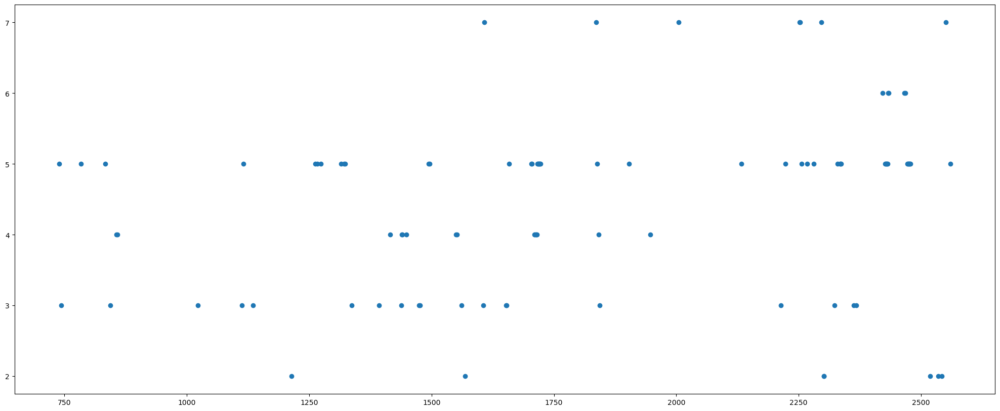

100


In [146]:
print(peaks)

#draw a scatter graph of peaks
plt.figure(figsize=(25, 10))
plt.scatter([x[1] for x in peaks], [x[0] for x in peaks])
plt.show()
print(len(peaks))

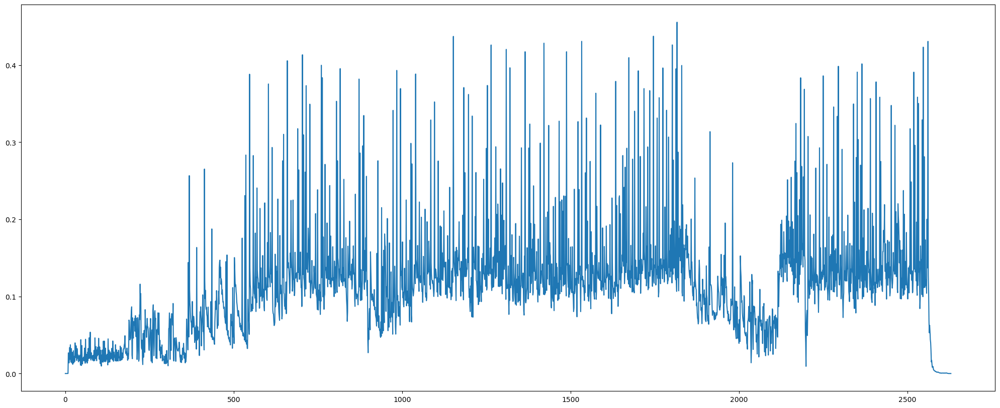

In [147]:
# drwaw a graph of maximum ampliuide of each frame
plt.figure(figsize=(25, 10))
plt.plot([np.max(frame) for frame in mel_spectrogram.T])
plt.show()

In [148]:
#iterate over the peaks  
eh = []
for (i,j) in peaks  :
    x = j - 9
    e = []
    for x in  range(j-9,j-2,2) :
        e.append(sum(mel_spectrogram[i][x:x+3]))
        
    for x in range(j+1,j+8,2):
        e.append(sum(mel_spectrogram[i][x:x+3]))
    eh.append(e)


In [149]:
len(eh)

100

In [150]:
ev = []
for (i,j) in peaks  :
    if j + 2 >= mel_spectrogram.shape[1] :
        continue
    e = []
    e.append(sum(mel_spectrogram[i+2][j-1:j+2]))
    e.append(sum(mel_spectrogram[i+1][j-1:j+2]))
    e.append(sum(mel_spectrogram[i-1][j-1:j+2]))
    e.append(sum(mel_spectrogram[i-2][j-1:j+2]))
    ev.append(e)
    print(len(e))

4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4


In [151]:
len(ev)

100

In [152]:
ec = []
for (i, j) in peaks:
    e = []
    x = sum(mel_spectrogram[i+1][j-2:j+1])
    x += sum(mel_spectrogram[i][j-2:j+1])
    e.append(x)
    x = sum(mel_spectrogram[i+1][j:j+3])
    x += sum(mel_spectrogram[i][j:j+3])
    e.append(x)
    x = sum(mel_spectrogram[i][j:j+3])
    x += sum(mel_spectrogram[i-1][j:j+3])
    e.append(x)
    x = sum(mel_spectrogram[i][j-2:j+1])
    x += sum(mel_spectrogram[i-1][j-2:j+1])
    e.append(x)
    ec.append(e)
    print(len(e))


4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4


In [153]:
len(ec)

100

In [154]:
eh = []
for (i,j) in peaks :
    e = []
    x = sum(mel_spectrogram[i+2][j-9:j-5])
    x += sum(mel_spectrogram[i+1][j-9:j-5])
    e.append(x)
    x = sum(mel_spectrogram[i+2][j-5:j-1])
    x += mel_spectrogram[i+1][j-5:j-1]
    e.append(x)
    x = sum(mel_spectrogram[i-1][j-9:j-5])
    x += sum(mel_spectrogram[i-2][j-9:j-5])
    e.append(x)
    x = sum(mel_spectrogram[i-1][j-5:j-1])
    x += sum(mel_spectrogram[i-2][j-5:j-1])
    e.append(x)
    x = sum(mel_spectrogram[i+2][j+2:j+6])
    x += sum(mel_spectrogram[i+1][j+2:j+6])
    e.append(x)
    x = sum(mel_spectrogram[i+2][j+6:j+10])
    x += sum(mel_spectrogram[i+1][j+6:j+10])
    e.append(x)
    x = sum(mel_spectrogram[i-1][j+2:j+6])
    x += sum(mel_spectrogram[i-2][j+2:j+6])
    e.append(x)
    x = sum(mel_spectrogram[i-1][j+6:j+10])
    x += sum(mel_spectrogram[i-2][j+6:j+10])
    e.append(x)
    eh.append(e)


8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8


In [155]:
len(eh)

100